In [ ]:
!pip install replicate

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.6/48.6 kB 5.3 MB/s eta 0:00:00


In [ ]:
from google.colab import files
files.upload()   # select test_image_class.jpeg

Saving test_image_class.jpeg to test_image_class (2).jpeg


{'test_image_class (2).jpeg': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xe2\x01\xd8ICC_PROFILE\x00\x01\x01\x00\x00\x01\xc8\x00\x00\x00\x00\x040\x00\x00mntrRGB XYZ \x07\xe0\x00\x01\x00\x01\x00\x00\x00\x00\x00\x00acsp\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\xf6\xd6\x00\x01\x00\x00\x00\x00\xd3-\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\tdesc\x00\x00\x00\xf0\x00\x00\x00$rXYZ\x00\x00\x01\x14\x00\x00\x00\x14gXYZ\x00\x00\x01(\x00\x00\x00\x14bXYZ\x00\x00\x01<\x00\x00\x00\x14wtpt\x00\x00\x01P\x00\x00\x00\x14rTRC\x00\x00\x01d\x00\x00\x00(gTRC\x00\x00\x01d\x00\x00\x00(bTRC\x00\x00\x01d\x00\x00\x00(cprt\x00\x00\x01\x8c\x00\x00\x00<mluc\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x0cenUS\x00\x00\x00\x08\x00\x00\x00\x1c\x00s\x00R

In [ ]:
import os
os.environ["REPLICATE_API_TOKEN"] = "r8_6..."
import replicate
client = replicate.Client(api_token=os.environ["REPLICATE_API_TOKEN"])
print(replicate.models.get("qwen/qwen-image-edit-2511").name)

qwen-image-edit-2511


In [ ]:
import replicate, requests, time
from PIL import Image
from io import BytesIO
import pandas as pd

TOKEN = "r8_6..."
client = replicate.Client(api_token=TOKEN)

IMG = "/content/test_image_class.jpeg"

# EDIT THESE PROMPTS :
tests = [
    ("recolor", "Change the color of [MAIN OBJECT] to blue. Keep everything else exactly the same."),
    ("remove",  "Remove [SOME OBJECT]. Keep everything else exactly the same."),
    ("replace", "Replace [MAIN OBJECT] with [NEW OBJECT]. Keep the background and layout exactly the same."),
]

def qwen_edit(image_path, prompt, operation):
    t0 = time.time()
    out = client.run("qwen/qwen-image-edit-2511",
                     input={"image": [open(image_path, "rb")], "prompt": prompt})
    elapsed = time.time() - t0
    url = out[0] if isinstance(out, list) else out
    img = Image.open(BytesIO(requests.get(str(url)).content))
    img.save(f"class_{operation}.png")
    print(f"[{operation}] {elapsed:.1f}s → class_{operation}.png")
    return {"operation": operation, "seconds": round(elapsed,1)}

results = []
for op, prompt in tests:
    try:
        results.append(qwen_edit(IMG, prompt, op))
    except Exception as e:
        print(f"[{op}] ERROR: {e}")
    time.sleep(15)   # avoid rate limit (6/min)

df = pd.DataFrame(results); df["cost_per_call_usd"] = 0.02
df.to_csv("class_benchmark.csv", index=False)
print("\n✅ done"); df

[recolor] 7.3s → class_recolor.png
[remove] 5.6s → class_remove.png
[replace] 7.8s → class_replace.png

✅ done


,operation,seconds,cost_per_call_usd
0,recolor,7.3,0.02
1,remove,5.6,0.02
2,replace,7.8,0.02


[recolor] 5.5s -> /content/class_recolor.png
[remove] 13.9s -> /content/class_remove.png
[replace] 17.1s -> /content/class_replace.png
[modern_bed] 16.9s -> /content/class_modern_bed.png
[remove_keyboard] 10.0s -> /content/class_remove_keyboard.png
[clear_desk] 5.5s -> /content/class_clear_desk.png
[add_pillows] 6.4s -> /content/class_add_pillows.png
      operation     model quality_1to5  arch_preservation  edit_strength  edited_%  speed_s  cost_usd
        recolor Qwen-2511                           0.922          0.871       9.4      5.5      0.02
         remove Qwen-2511                           0.947          0.765      11.2     13.9      0.02
        replace Qwen-2511                           0.930          0.928       1.5     17.1      0.02
     modern_bed Qwen-2511                           0.905          0.761      15.0     16.9      0.02
remove_keyboard Qwen-2511                           0.964          0.197      24.3     10.0      0.02
     clear_desk Qwen-2511          

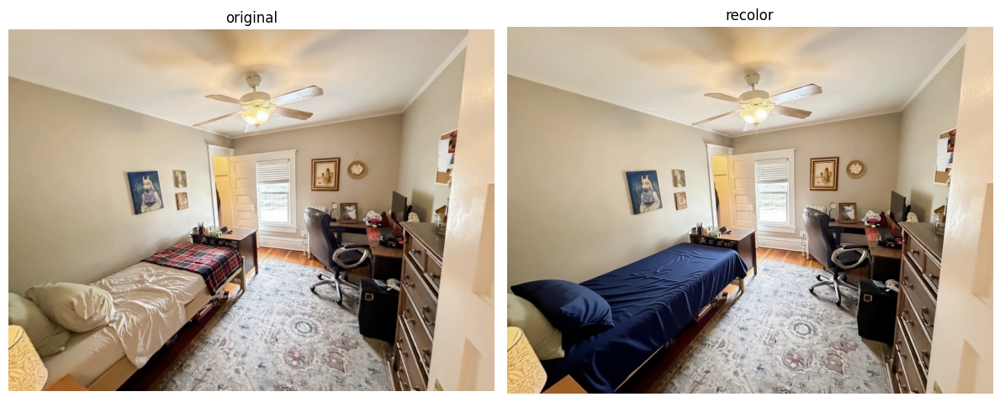

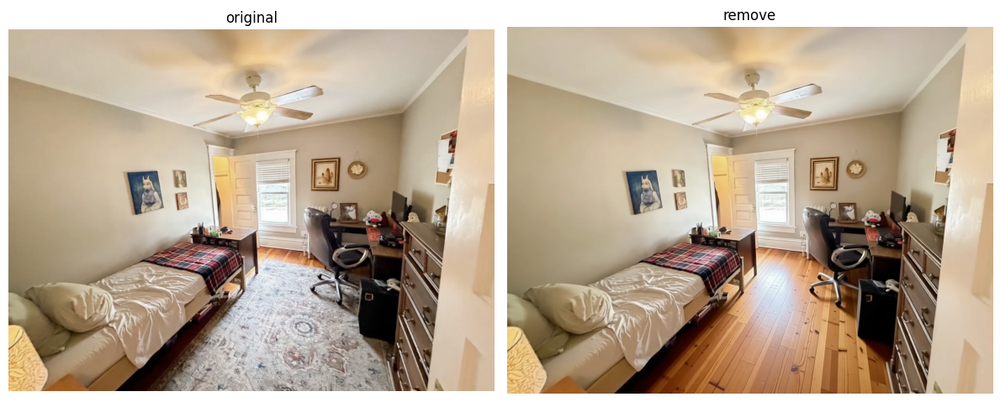

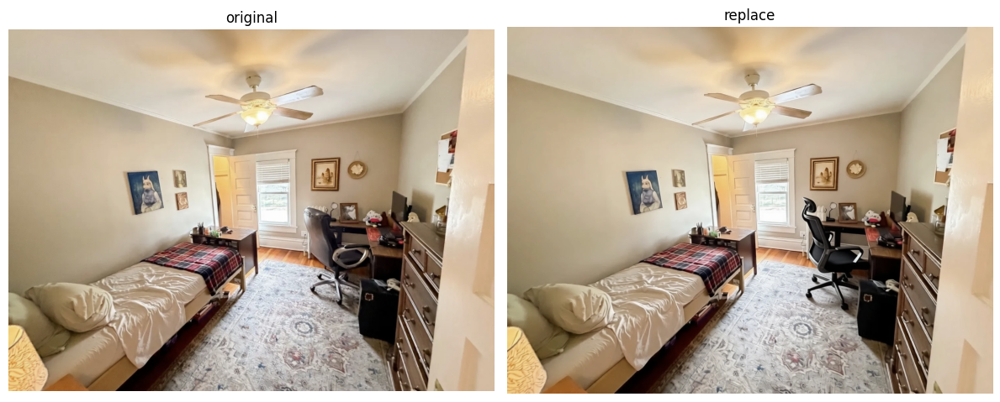

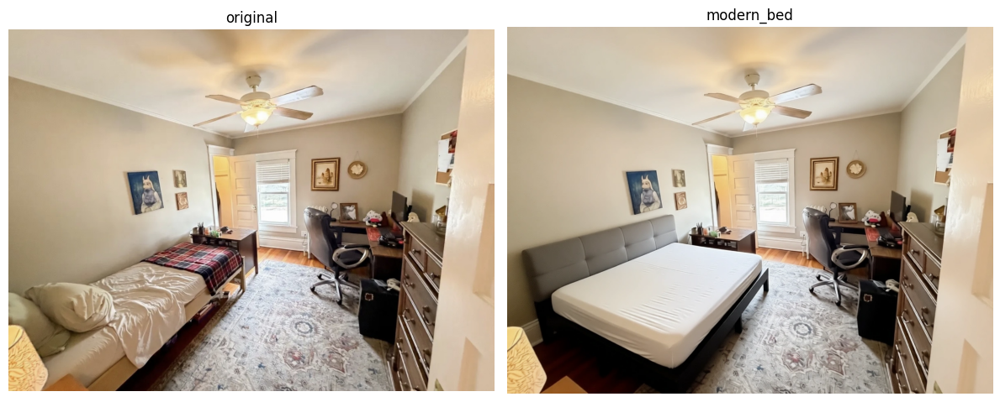

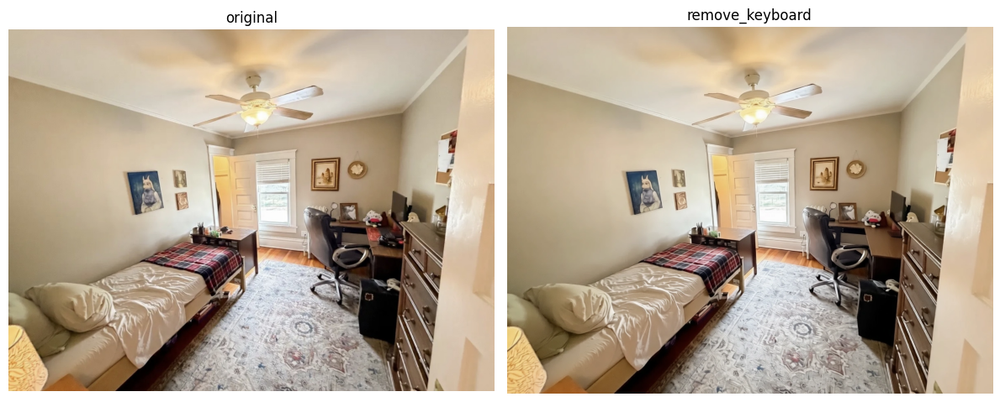

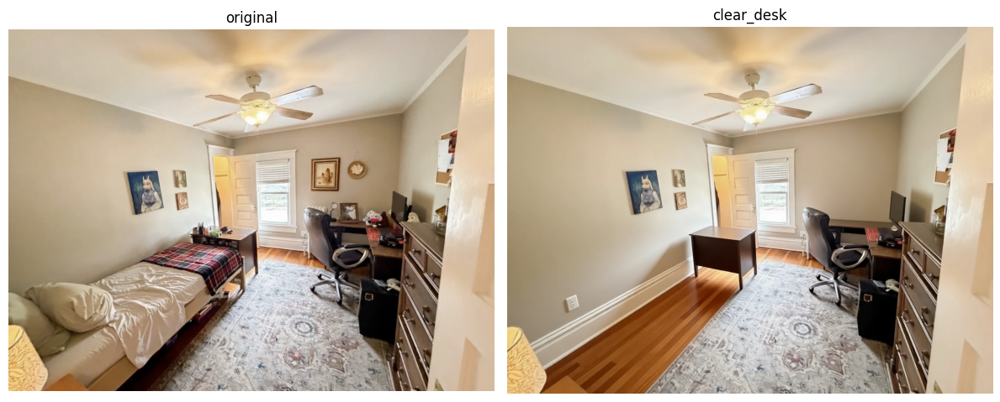

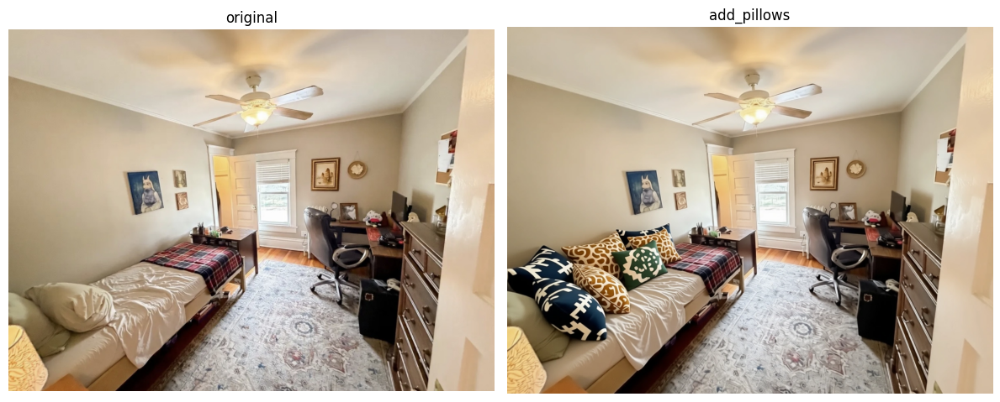

In [ ]:
#  clear stale edits -> generate all edits -> benchmark
import os, time, requests, cv2, numpy as np, pandas as pd
from PIL import Image
from io import BytesIO
from skimage.metrics import structural_similarity as ssim
from google.colab import files

REGENERATE = True

if not os.path.exists("/content/test_image_class.jpeg"):
    up = files.upload()
    os.rename("/content/" + next(iter(up)), "/content/test_image_class.jpeg")
IMG = "/content/test_image_class.jpeg"

# 2) the operations
OPS = {
 "recolor":         "Change the color of the bed cover to navy blue. Keep everything else exactly the same.",
 "remove":          "Remove the rug on the floor. Keep everything else exactly the same.",
 "replace":         "Replace the office chair with a modern chair. Keep the background and layout the same.",
 "modern_bed":      "Replace the bed with a modern platform bed with a low upholstered headboard. Keep walls, windows, door, ceiling fan, desk, dresser, rug and everything else exactly the same.",
 "remove_keyboard": "Remove only the keyboard from the desk. Keep the monitor, chair, desk, headphones and everything else exactly the same.",
 "clear_desk":      "Remove everything from the desk, but leave the computer, the picture frame, and the lamp. Keep the desk, chair, walls, floor, and everything else in the room exactly the same.",
 "add_pillows":     "Add additional decorative pillows to the bed. Keep the bed frame, bedding color, walls, floor, and everything else in the room exactly the same.",
}

if REGENERATE:
    for op in OPS:
        p = f"/content/class_{op}.png"
        if os.path.exists(p):
            os.remove(p)

SECONDS = {}
for op, prompt in OPS.items():
    f = f"/content/class_{op}.png"
    if not os.path.exists(f):
        t0 = time.time()
        out = client.run("qwen/qwen-image-edit-2511",
                         input={"image": [open(IMG, "rb")], "prompt": prompt})
        url = out[0] if isinstance(out, (list, tuple)) else out
        Image.open(BytesIO(requests.get(str(url)).content)).save(f)
        SECONDS[op] = round(time.time() - t0, 1)
        print(f"[{op}] {SECONDS[op]}s -> {f}")
        time.sleep(5)
    else:
        SECONDS[op] = None

# 3) benchmark each edit vs the original
def reg(a, b):
    H, W = a.shape[:2]; b = cv2.resize(b, (W, H)); o = cv2.ORB_create(4000)
    ka, da = o.detectAndCompute(cv2.cvtColor(a, cv2.COLOR_RGB2GRAY), None)
    kb, db = o.detectAndCompute(cv2.cvtColor(b, cv2.COLOR_RGB2GRAY), None)
    if da is None or db is None: return b
    m = sorted(cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True).match(db, da), key=lambda x: x.distance)[:400]
    if len(m) < 12: return b
    s = np.float32([kb[x.queryIdx].pt for x in m]).reshape(-1, 1, 2)
    d = np.float32([ka[x.trainIdx].pt for x in m]).reshape(-1, 1, 2)
    Hm, _ = cv2.findHomography(s, d, cv2.RANSAC, 5.0)
    return cv2.warpPerspective(b, Hm, (W, H)) if Hm is not None else b

a = cv2.cvtColor(cv2.imread(IMG), cv2.COLOR_BGR2RGB); rows = []
for op in OPS:
    f = f"/content/class_{op}.png"
    if not os.path.exists(f): continue
    b = reg(a, cv2.cvtColor(cv2.imread(f), cv2.COLOR_BGR2RGB))
    _, sm = ssim(a, b, channel_axis=2, full=True); sm = sm.mean(2)
    dd = cv2.GaussianBlur(cv2.normalize(np.abs(a.astype(int) - b.astype(int)).sum(2),
                          None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8), (5, 5), 0)
    _, mask = cv2.threshold(dd, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, np.ones((15, 15), np.uint8), 3); m = mask > 0
    rows.append({"operation": op, "model": "Qwen-2511", "quality_1to5": "",
                 "arch_preservation": round(float(sm[~m].mean()), 3),
                 "edit_strength": round(1 - float(sm[m].mean()), 3) if m.any() else None,
                 "edited_%": round(float(m.mean() * 100), 1),
                 "speed_s": SECONDS.get(op), "cost_usd": 0.02})

df = pd.DataFrame(rows); df.to_csv("/content/benchmark.csv", index=False)
print(df.to_string(index=False)); print("\nsaved -> /content/benchmark.csv")

# 4) show all edits next to the original
import matplotlib.pyplot as plt
orig = Image.open(IMG)
for op in OPS:
    f = f"/content/class_{op}.png"
    if not os.path.exists(f): continue
    fig, ax = plt.subplots(1, 2, figsize=(12, 5))
    ax[0].imshow(orig); ax[0].set_title("original"); ax[0].axis("off")
    ax[1].imshow(Image.open(f)); ax[1].set_title(op); ax[1].axis("off")
    plt.tight_layout(); plt.show()


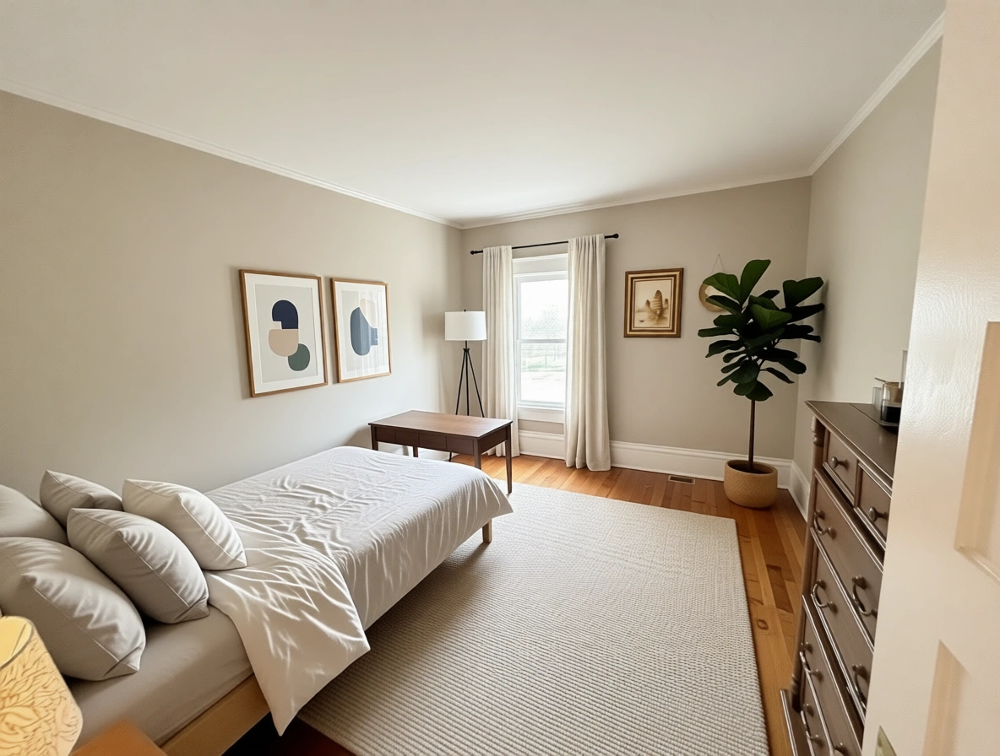

In [ ]:
import urllib.request
from IPython.display import Image, display

SRC = "/content/test_image_class.jpeg"

prompt = ("Redesign this entire room into a clean, cohesive modern style on a "
    "modest budget: neutral minimalist bedding and throw pillows, a low-pile "
    "neutral area rug, light linen curtains, two framed abstract prints, a "
    "modern floor lamp, a potted plant, warm wood and matte-black accents, and "
    "a decluttered, styled look. Keep the exact same walls, ceiling, floor, "
    "flooring material, window position, door, room layout, and camera angle "
    "unchanged.")

out = client.run(
    "qwen/qwen-image-edit-2511",
    input={"image": [open(SRC, "rb")], "prompt": prompt},
)

url = out[0] if isinstance(out, (list, tuple)) else out
if isinstance(url, str):
    urllib.request.urlretrieve(url, "/content/redesign_modern.png")
else:
    open("/content/redesign_modern.png", "wb").write(url.read())

display(Image("/content/redesign_modern.png"))

In [ ]:
from google.colab import userdata
from google import genai

key = userdata.get("GEMINI_API_KEY")
gem = genai.Client(api_key=key)
print("Gemini client ready")

Gemini client ready


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.8/55.8 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 984.2/984.2 kB 42.4 MB/s eta 0:00:00
[gemini recolor] 16.4s -> /content/gemini_recolor.png
[gemini remove] 18.1s -> /content/gemini_remove.png
[gemini replace] 16.3s -> /content/gemini_replace.png
[gemini modern_bed] 16.4s -> /content/gemini_modern_bed.png
[gemini remove_keyboard] 16.3s -> /content/gemini_remove_keyboard.png
[gemini clear_desk] 16.1s -> /content/gemini_clear_desk.png
[gemini add_pillows] 16.9s -> /content/gemini_add_pillows.png

--- per operation ---
      operation              model quality_1to5  arch_preservation  edit_strength  edited_%  speed_s  cost_usd
    add_pillows Gemini-3-Pro-Image                           0.885          0.852       2.7     16.9     0.134
    add_pillows          Qwen-2511          NaN              0.917          0.898       7.0      6.4     0.020
     clear_desk Gemini-3-Pro-Image                           0.939     

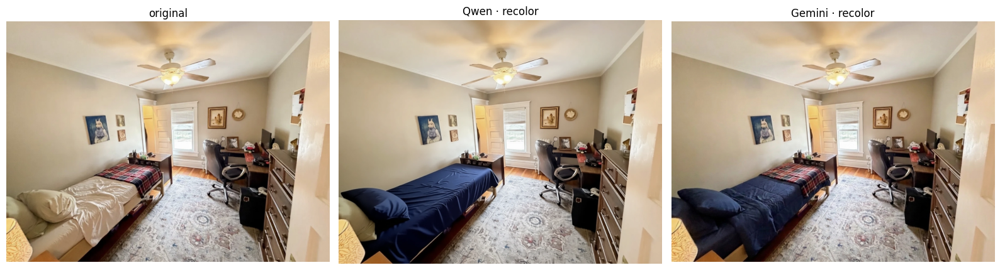

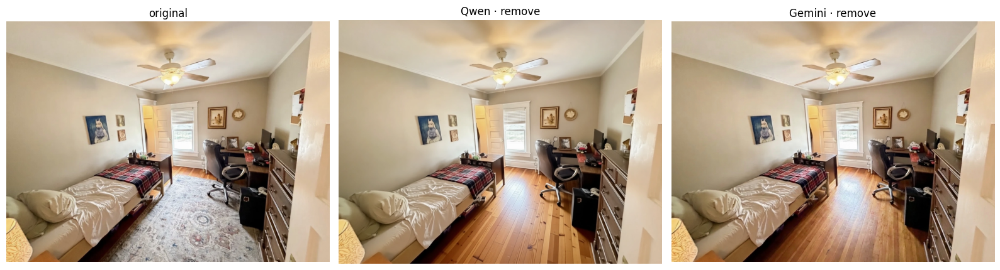

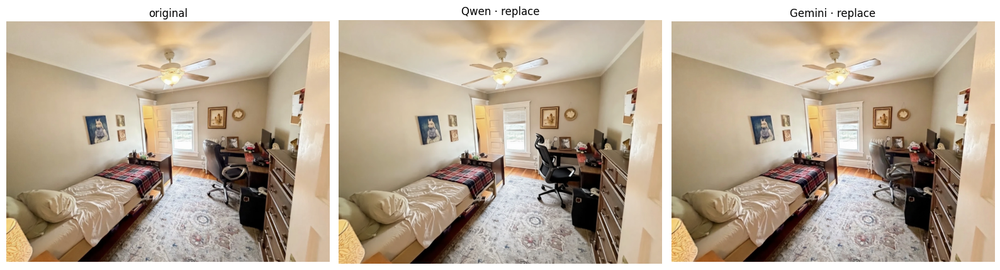

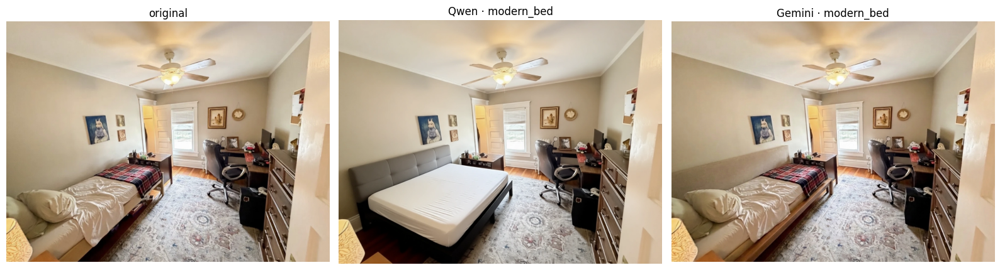

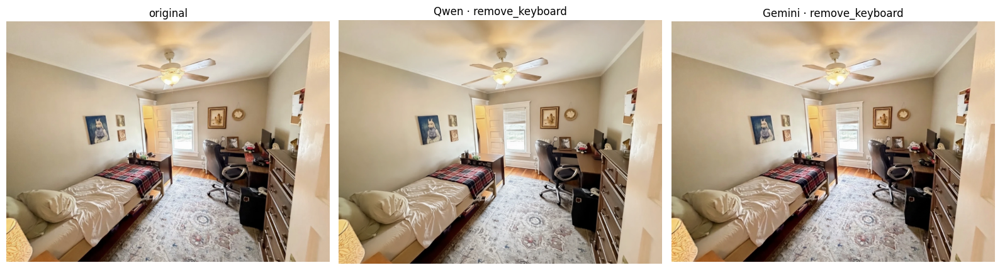

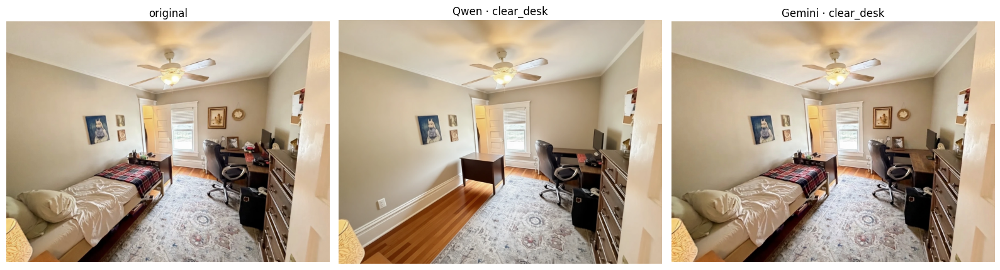

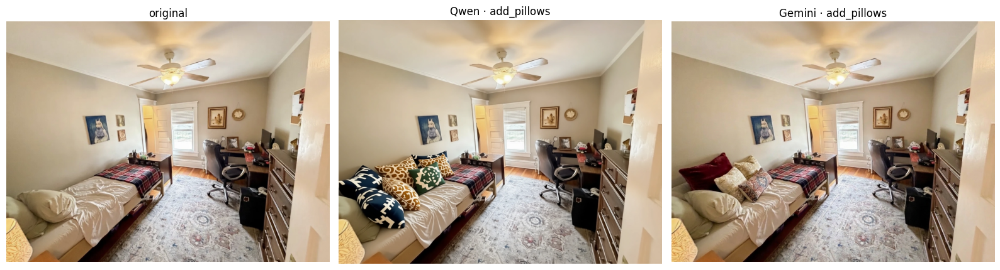

In [ ]:
# GEMINI SIDE + Qwen-vs-Gemini comparison

%pip install --upgrade --quiet google-genai
import os, time, cv2, numpy as np, pandas as pd
from PIL import Image
from io import BytesIO
from skimage.metrics import structural_similarity as ssim
from google import genai
from google.colab import userdata

gem = genai.Client(api_key=userdata.get("GEMINI_API_KEY"))
IMG = "/content/test_image_class.jpeg"
COST_GEMINI = 0.134   #per-call list price for Gemini 3 Pro Image

# SAME prompts as the Qwen run -- identical inputs is what makes the comparison fair
OPS = {
 "recolor":         "Change the color of the bed cover to navy blue. Keep everything else exactly the same.",
 "remove":          "Remove the rug on the floor. Keep everything else exactly the same.",
 "replace":         "Replace the office chair with a modern chair. Keep the background and layout the same.",
 "modern_bed":      "Replace the bed with a modern platform bed with a low upholstered headboard. Keep walls, windows, door, ceiling fan, desk, dresser, rug and everything else exactly the same.",
 "remove_keyboard": "Remove only the keyboard from the desk. Keep the monitor, chair, desk, headphones and everything else exactly the same.",
 "clear_desk":      "Remove everything from the desk, but leave the computer, the picture frame, and the lamp. Keep the desk, chair, walls, floor, and everything else in the room exactly the same.",
 "add_pillows":     "Add additional decorative pillows to the bed. Keep the bed frame, bedding color, walls, floor, and everything else in the room exactly the same.",
}

# 1) generate each edit with Gemini, timed
room = Image.open(IMG)
SEC = {}
for op, prompt in OPS.items():
    f = f"/content/gemini_{op}.png"
    if os.path.exists(f):
        SEC[op] = None; continue
    t0 = time.time()
    resp = gem.models.generate_content(model="gemini-3-pro-image-preview", contents=[prompt, room])
    for part in resp.candidates[0].content.parts:
        if getattr(part, "inline_data", None):
            Image.open(BytesIO(part.inline_data.data)).save(f)
    SEC[op] = round(time.time() - t0, 1)
    print(f"[gemini {op}] {SEC[op]}s -> {f}")
    time.sleep(3)

# 2) SAME benchmark function used on Qwen
def reg(a, b):
    H, W = a.shape[:2]; b = cv2.resize(b, (W, H)); o = cv2.ORB_create(4000)
    ka, da = o.detectAndCompute(cv2.cvtColor(a, cv2.COLOR_RGB2GRAY), None)
    kb, db = o.detectAndCompute(cv2.cvtColor(b, cv2.COLOR_RGB2GRAY), None)
    if da is None or db is None: return b
    m = sorted(cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True).match(db, da), key=lambda x: x.distance)[:400]
    if len(m) < 12: return b
    s = np.float32([kb[x.queryIdx].pt for x in m]).reshape(-1, 1, 2)
    d = np.float32([ka[x.trainIdx].pt for x in m]).reshape(-1, 1, 2)
    Hm, _ = cv2.findHomography(s, d, cv2.RANSAC, 5.0)
    return cv2.warpPerspective(b, Hm, (W, H)) if Hm is not None else b

def score(orig, edit):
    a = cv2.cvtColor(cv2.imread(orig), cv2.COLOR_BGR2RGB)
    b = reg(a, cv2.cvtColor(cv2.imread(edit), cv2.COLOR_BGR2RGB))
    _, sm = ssim(a, b, channel_axis=2, full=True); sm = sm.mean(2)
    dd = cv2.GaussianBlur(cv2.normalize(np.abs(a.astype(int)-b.astype(int)).sum(2),
                          None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8), (5, 5), 0)
    _, mask = cv2.threshold(dd, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, np.ones((15,15),np.uint8), 3); m = mask > 0
    return (round(float(sm[~m].mean()),3),
            round(1-float(sm[m].mean()),3) if m.any() else None,
            round(float(m.mean()*100),1))

rows = []
for op in OPS:
    f = f"/content/gemini_{op}.png"
    if not os.path.exists(f): continue
    ap, es, ea = score(IMG, f)
    rows.append({"operation": op, "model": "Gemini-3-Pro-Image", "quality_1to5": "",
                 "arch_preservation": ap, "edit_strength": es, "edited_%": ea,
                 "speed_s": SEC.get(op), "cost_usd": COST_GEMINI})
gem_df = pd.DataFrame(rows)

# 3) merge with the Qwen table -> one comparison
qwen_df = pd.read_csv("/content/benchmark.csv")
both = pd.concat([qwen_df, gem_df], ignore_index=True)
both.to_csv("/content/comparison.csv", index=False)

# per-operation, side by side
print("\n--- per operation ---")
print(both.sort_values(["operation","model"]).to_string(index=False))

# head-to-head summary (means)
print("\n--- summary (means across operations) ---")
summ = both.groupby("model").agg(
    arch_preservation=("arch_preservation","mean"),
    edit_strength=("edit_strength","mean"),
    speed_s=("speed_s","mean"),
    cost_usd=("cost_usd","mean")).round(3)
print(summ.to_string())


# 4) three-way view per op: original | qwen | gemini
import matplotlib.pyplot as plt
orig = Image.open(IMG)
for op in OPS:
    q, g = f"/content/class_{op}.png", f"/content/gemini_{op}.png"
    if not (os.path.exists(q) and os.path.exists(g)): continue
    fig, ax = plt.subplots(1, 3, figsize=(16, 5))
    ax[0].imshow(orig); ax[0].set_title("original")
    ax[1].imshow(Image.open(q)); ax[1].set_title(f"Qwen · {op}")
    ax[2].imshow(Image.open(g)); ax[2].set_title(f"Gemini · {op}")
    for x in ax: x.axis("off")
    plt.tight_layout(); plt.show()